<a href="https://colab.research.google.com/github/tbahng/IST718-FinalProject/blob/master/TwitterAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Specification
On March 11, 2020, Covid-19 was declared a pandemic by the WHO. Since then, most or all of the countries around the world have been affected one way or the other. Some have been affected more than others, particularly the United States. This virus has impacted population and industry like no other event in modern history. As a result, one may be interested to find out how social networks reflect this impact via the underlying topics of discussion in tweets.

#### This analysis seeks to identify major topics of discussion in Social Media concerning Coronavirus / Covid-19 so that it may be inferred how the pandemic has affected people and what the future may look like socially.

Prior to this analysis:
1. Tweet IDs were obtained from Open Resource Covid-19 Chatter Dataset for the Global Research Community. According to the source, these tweets were collected on a daily basis and the cleaned version used here excludes retweets. This original data set contained 142 million unique tweet IDs. (see accompanying notebook: "**Download Open Resource Covid-19 Twitter Chatter Dataset.ipynb**")
2. 80 million tweets were created in 2020 and in the English language. These were down-sampled to a 300k subset through stratified random sampling, assuming that the tweet ids were sorted by date. There is reason to believe this to be case as separate repositories exist for daily collection. These were then hydrated through the Twitter API. (see accompanying notebook: "**HydrateTweets.ipynb**")

In [ ]:
# how much ram do i have?
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.4 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
# imports
from datetime import datetime
import time 
import re 
from google.colab import drive
from collections import Counter
import json
import numpy as np
import pandas as pd
from urllib.request import urlopen
import nltk
from nltk import pos_tag
nltk.download('averaged_perceptron_tagger')
import nltk
nltk.download('stopwords')
nltk.download('punkt')
# sentiment analysis
from textblob import TextBlob
# visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')
# analysis
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from nltk.corpus import stopwords
import gc

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


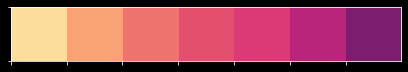

In [ ]:
import matplotlib.colors
# Create an array with the colors you want to use
colors = ["#FCDE9C","#FAA476","#F0746E","#E34F6F","#DC3977","#B9257A","#7C1D6F"]
sunsetdark = sns.set_palette(sns.color_palette(colors))
sns.palplot(sns.color_palette())
norm = matplotlib.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#FCDE9C"],
          [norm(-0.7), "#FAA476"],
          [norm(-0.3),"#F0746E"],
          [norm(0.0),"#E34F6F"],
          [norm(0.3),"#DC3977"],
          [norm( 0.7), "#B9257A"],
          [norm( 1.0), "#7C1D6F"]]

SDcmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
single_dim_color = "#7C1D6F"

In [ ]:
# mount google drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


A sample of approximately 300K tweets were used in this analysis. These were out of a total of 81M tweets in the English language, created between January 2020 and August 2020.

In [ ]:
# open tweet file
#fname = 'drive/Shared drives/IST718-Summer2020-Team/Twitter/english2020_sample3k.json' # ~3k sample
#fname = 'drive/Shared drives/IST718-Summer2020-Team/Twitter/english2020_sample30k.json' # ~30k sample
fname = 'drive/Shared drives/IST718-Summer2020-Team/Twitter/english2020_sample300k.json' # ~300k sample
with open(fname, 'r') as fin:
  data = json.loads(fin.read())

In [ ]:
print("Attributes collected per tweet:\n")
data[0].keys()

Attributes collected per tweet:



dict_keys(['id', 'created_at', 'text', 'coordinates', 'place'])

# Observation
This section will explore and visualize the data for patterns and insights that may be useful considerations for further analysis.

- Assess the frequency of observations with geospatial attributes
- Plot of Tweet creation dates
- A word cloud of Tweets
- Plot of sentiment polarity and frequency
- Plot the frequency of observations by semantic labels from the LIWC lexicon

### Frequency of Geospatial attributes

In [ ]:
coord_list = [x['coordinates'] for x in data if x['coordinates'] is not None]
place_list = [x['place'] for x in data if x['place'] is not None]
print("Out of {:d} samples: \n- only {:d} contain longitude/latitude coordinates \n- only {:d} contain a place".format(len(data),len(coord_list),len(place_list)))

Out of 266473 samples: 
- only 418 contain longitude/latitude coordinates 
- only 8250 contain a place


Only 0.1% of the tweets collected are tied to a longitude/latitude point coordinate. Only 3% of tweets make some reference to a place through the geo object metadata available from the Twitter API.

The most precise geospatial attribute is 'coordinates'. The vast majority of tweets in a sample do not contain a longitude/latitude value in 'coordinates'. 

The other attribute called 'place' is less sparse but may or may not contain useful information in determining country-level or lower levels of detail. If point coordinates don't exist for tweets, this analysis will use the center of the 'bounding_box' which contains a list of four longitude/latitude coordinates.

If a longitude/latitude point coordinate or approximation of one is available, the Google Maps API is used to extract address components from the coordinates. Specifically these geographic attributes are the state and country respective to a tweet.

Resources:
* More information about Tweet geo objects: https://developer.twitter.com/en/docs/twitter-api/v1/data-dictionary/overview/geo-objects
* More information about Google Maps API Geocode: https://developers.google.com/maps/gmp-get-started

Identifying tweet locations
* Determined by first the point coordinate of the tweet, and the coordinate center of the place bounding box if the former doesn't exist
* If a tweet has a point coordinate, then it was determined to also have a place.

In [ ]:
# get google maps api key
fname = 'drive/My Drive/IST 718/secret_google_key.txt'
key_dict = {}
with open(fname, 'r') as fin:
  lines = [line.strip().split() for line in fin]
  for line in lines:
    key_dict[line[0]] = line[2].strip('\'')
key = key_dict['KEY']

In [ ]:
# function to compute a simple center coordinate of tweet place bounding box coordinates
# assumes a rectangular (not spherical) bounding area
def getCoord(c):
  longs = []
  lats = []
  for clist in c[0]:
    longs.append(clist[0])
    lats.append(clist[1])
  mean_long = np.mean(longs)
  mean_lat = np.mean(lats)
  return [mean_long, mean_lat]

In [ ]:
# function to get specific address components from a list of longitude/latitude coordinates
# more info on getting started with google maps api: https://developers.google.com/maps/gmp-get-started
def getGeoData(lon, lat):
  url = "https://maps.googleapis.com/maps/api/geocode/json?"
  url += "latlng=%s,%s&sensor=false&key=%s" % (lat, lon, key)
  v = urlopen(url).read()
  j = json.loads(v)
  components = j['results'][0]['address_components']
  country = state = None  
  for c in components:
    if 'country' in c['types']:
      country = c['long_name']
    if 'administrative_area_level_1' in c['types']:
      state = c['short_name']
  return {'state': state, 'country': country}

In [ ]:
%%time
# list of dictionaries of {state, country} respective to tweets
state_country_list = []
for tweet in data:
  try:
    # first check if there are coordinates
    if tweet['coordinates'] is not None:
      coordinates = tweet['coordinates']['coordinates']
      # google geocode to acquire state and country
      state_country_list.append(getGeoData(coordinates[0],coordinates[1]))
    # otherwise check if there is a place
    elif tweet['place'] is not None:
      # compute the center coordinate of the bounding box of the place
      coordinates = getCoord(tweet['place']['bounding_box']['coordinates'])
      # google geocode to acquire state and country
      state_country_list.append(getGeoData(coordinates[0],coordinates[1]))
    else:
      state_country_list.append({'state': None, 'country': None})
  except:
    state_country_list.append({'state': None, 'country': None})

CPU times: user 22.6 s, sys: 4.06 s, total: 26.7 s
Wall time: 6min 29s


In [ ]:
# dataframe of tweets
df = pd.concat([
  pd.DataFrame(data), # original tweet data
  pd.DataFrame(state_country_list)                
], axis=1)[['id','created_at','text','state','country']]

In [ ]:
df.country.value_counts()

United States     4112
United Kingdom    1173
India              684
Canada             353
Nigeria            268
                  ... 
Jersey               1
Eswatini             1
Ukraine              1
South Sudan          1
Costa Rica           1
Name: country, Length: 126, dtype: int64

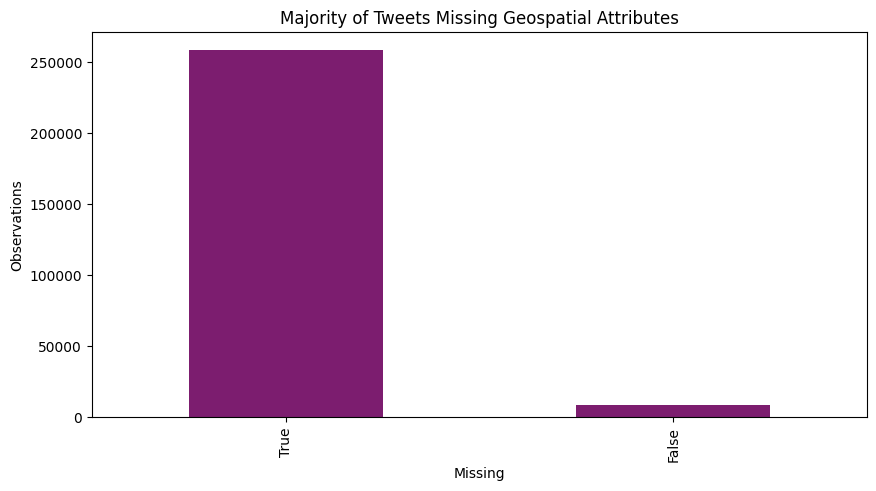

In [ ]:
style.use('default')
df['country'].isna().value_counts().plot.bar(color=single_dim_color)
plt.title("Majority of Tweets Missing Geospatial Attributes")
plt.xlabel("Missing")
plt.ylabel("Observations")
plt.gcf().set_size_inches(10,5)
plt.show()

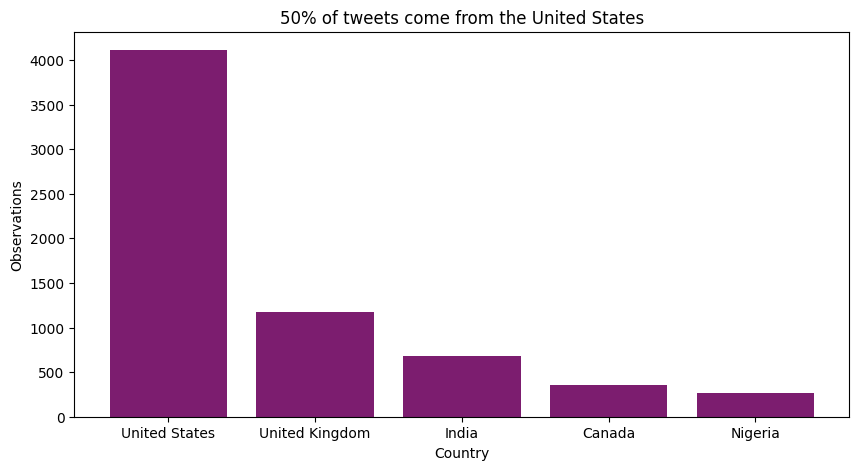

In [ ]:
style.use('default')
labels, values = zip(*Counter(df.loc[df['country'].notnull(), 'country']).most_common(5))

indexes = np.arange(len(labels))
width = 0.8
plt.bar(labels, values, width, color = single_dim_color)
plt.title("50% of tweets come from the United States")
plt.xlabel("Country")
plt.ylabel("Observations")
plt.gcf().set_size_inches(10,5)
plt.show()

Of the tweets that reference a location, about 50% come from the United States.

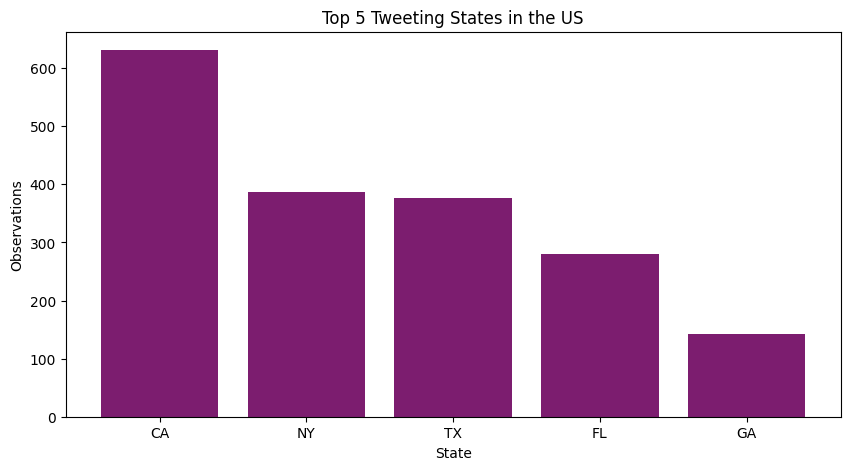

In [ ]:
style.use('default')
labels, values = zip(*Counter(df.loc[(df['state'].notnull()) & (df['country'] == 'United States'), 'state']).most_common(5))

indexes = np.arange(len(labels))
width = 0.8
plt.bar(labels, values, width, color = single_dim_color)
plt.title("Top 5 Tweeting States in the US")
plt.xlabel("State")
plt.ylabel("Observations")
plt.gcf().set_size_inches(10,5)
plt.show()

California, New York, Texas, Florida, and Georgia represent the states that tweeted the most.

### Tweet Creation Dates

In [ ]:
def get_date(created_at):
    """Function to convert Twitter created_at to date format
    Argument:
        created_at {[str]} -- [raw tweet creation date time stamp]
    Returns:
        [str] -- [date e.g. 'Tue Jan 28 22:16:20 +0000 2020']
    """
    return time.strftime('%Y-%m-%d', time.strptime(created_at, '%a %b %d %H:%M:%S +0000 %Y'))

def get_date_time(tweetdate):
    """Function to convert twitter date to date time object
    
    Arguments:
        tweetdate {[str]} -- [twitter created at date]
    
    Returns:
        [datetime.datetime] -- [date time object]
    """
    
    dt = datetime.strptime(tweetdate, "%a %b %d %H:%M:%S +0000 %Y")
    return dt 

In [ ]:
df['created_at_date'] = df['created_at'].apply(get_date_time)
df['created_at_date'] = df['created_at_date'].dt.date

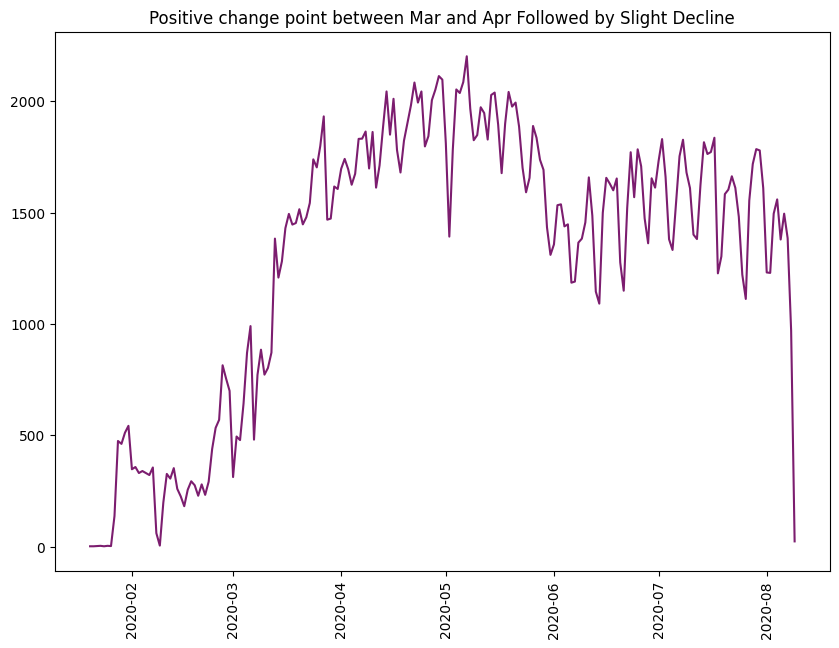

In [ ]:
X,Y = np.unique(df['created_at_date'], return_counts=True)
plt.figure(figsize=(10,7))
plt.plot(X, Y, color = "#7C1D6F")
plt.xticks(rotation=90)
plt.title("Positive change point between Mar and Apr Followed by Slight Decline")
plt.show()

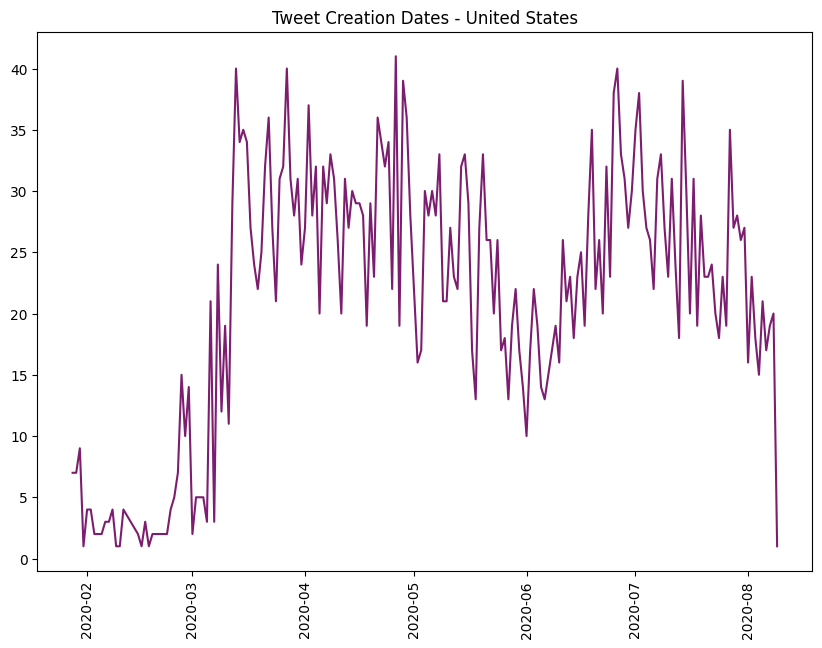

In [ ]:
X,Y = np.unique(df.loc[df['country'] == 'United States','created_at_date'], return_counts=True)
plt.figure(figsize=(10,7))
plt.plot(X, Y, color = "#7C1D6F")
plt.xticks(rotation=90)
plt.title("Tweet Creation Dates - United States")
plt.show()

The majority of tweets in this data set range from February 2020 to Auguest 2020. There appears to be a steep positive change point between March and April 2020, with a slightly downward trend beginning between June and July. This seems to coincide with major announcements of quarantine and shutdown heard around the globe.

### Tweet Text Processing and Word Cloud
It is worth mentioning that stopwords include the words 'coronavirus', 'virus', and 'pandemic'. All of these tweets are related to coronavirus in one way or another.

In [ ]:
from wordcloud import WordCloud
from nltk import word_tokenize, FreqDist
from nltk.corpus import stopwords
stop_words = list(set(stopwords.words('english')))
stop_words.extend(['rt','amp','coronavirus','virus','pandemic','covid','fucking','shit','fuck','via']) # retweet / ampersand / coronavirus

def clean_tweet(tweet):
    """Utility function to clean tweet text by removing links
    , hashtags, @mentions, and numbers
        using simple regex statements. Converts text to lowercase
    
    Arguments:
        tweet {[str]} -- [tweet text]
    
    Returns:
        [str] -- [clean tweet text]
    """    
    # remove links, hashtags, mentions, convert to lowercase
    pattern = re.compile("(\\w+:\\/\\/\\S+)|(#[A-Za-z0-9]+)|(@[A-Za-z]+[A-Za-z0-9-_]+)")
    tweet = re.sub(pattern, ' ', tweet).lower() 
    # remove numbers
    words = tweet.split()
    reformed = [word for word in words if not re.match('\\d', word)]
    tweet = ' '.join(reformed)
    out = ' '.join(tweet.split())
    return out   

def get_wc(documents, title):
    """Function to plot word cloud
    
    Arguments:
        documents {[list]} -- [list of strings i.e. tweets]
        title {[str]} -- [title of plot]
    """ 
    docs = [word_tokenize(tweet) for tweet in documents]        
    words = []
    for doc in docs:
        words.extend(doc)
    filtered_words = [w for w in words if w.isalpha() if not w in stop_words]
    text = ' '.join(word for word in filtered_words)    
    wordcloud = WordCloud(max_font_size=160,relative_scaling=1,background_color='white',colormap=SDcmap,width=1000,height=700).generate(text)
    plt.figure(figsize=(10,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

def get_wc_obj(documents, WCwidth, WCheight):
    """Function to return word cloud object
    default wc width 400 height 200
    Arguments:
        documents {[list]} -- [list of strings i.e. tweets]
        title {[str]} -- [title of plot]
    """ 
    docs = [word_tokenize(tweet) for tweet in documents]        
    words = []
    for doc in docs:
        words.extend(doc)
    filtered_words = [w for w in words if w.isalpha() if not w in stop_words]
    text = ' '.join(word for word in filtered_words)    
    wordcloud = WordCloud(max_font_size=160,relative_scaling=1,background_color='white',colormap=SDcmap,width=WCwidth, height=WCheight).generate(text)    
    return wordcloud

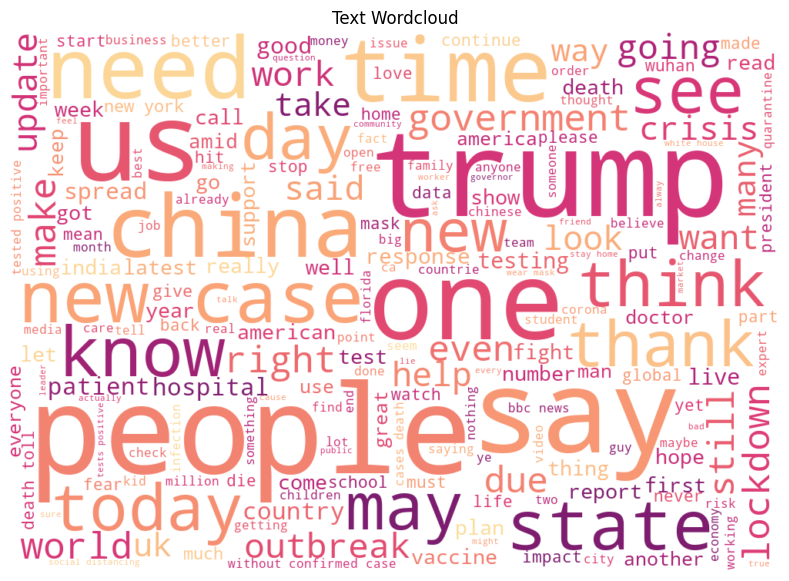

CPU times: user 1min 14s, sys: 826 ms, total: 1min 15s
Wall time: 1min 15s


In [ ]:
%%time
# clean tweets remove links, hashtags, mentions, convert to lowercase, and numbers
df['text_clean'] = df['text'].apply(clean_tweet)
get_wc(df['text_clean'], "Text Wordcloud")

Common themes such as politics appear in the data. It would appear that government action and policy are at the forefront of the conversations. Aside from health-related terms, emotive, cognitive, and temporal terms appear quite frequently.

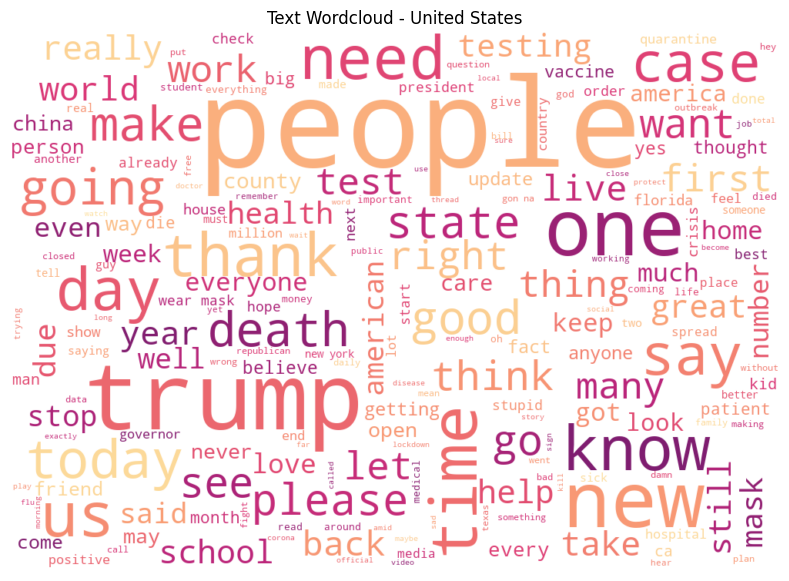

In [ ]:
get_wc(df.loc[df['country'] == 'United States','text_clean'], "Text Wordcloud - United States")

It is interesting that the term mask is much more pronounced when data is subset to US only tweets. Perhaps it might be the case that users who tweet about masks are more conscious about enabling geolocation, versus when discussing other topics.

Possible discussion topics could include masks, schools, debate, outbreaks, policy, statistics, vaccine, healthcare, and testing.

### Tweet Sentiment Polarity and Frequency

In [ ]:
from textblob import TextBlob

def get_sentiment(score):
    """Utility function to classify sentiment of passed tweet 
        using textblob's sentiment method 
    
    Arguments:
        scores {[float]} -- [Textblob score]
    
    Returns:
        [str] -- [sentiment label]
    """    
    # sentiment labels
    if score > 0:
        return 'pos'
    elif score == 0:
        return 'neu'
    else:
        return 'neg'
def plot_sentiment(scorelist, title):
    """Barplot of sentiment labels
    
    Arguments:
        scorelist {[list]} -- [list of Textblob scores]        
        title {[str]} -- [title of plot]
    """
    sentlist = [get_sentiment(score) for score in scorelist]
    counter = Counter(sentlist)
    labels = counter.keys()
    values = [v / sum(counter.values()) for v in counter.values()]
    labels, values = zip(*sorted(zip(labels,values)))
    indexes = np.arange(len(labels))
    width = 0.5
    plt.barh(indexes, values, width, color = "#7C1D6F")
    plt.yticks(indexes, labels)
    plt.xlabel('Count')
    plt.title(title)

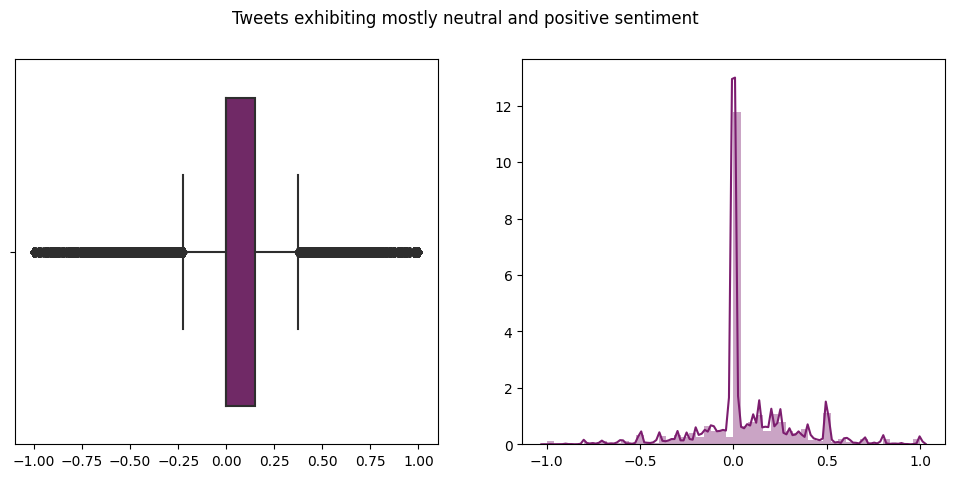

In [ ]:
scorelist = [TextBlob(tweet).sentiment.polarity for tweet in df['text_clean']]
fig, (ax_box, ax_hist) = plt.subplots(ncols = 2)
fig.set_size_inches(12,5)
sns.boxplot(scorelist, ax=ax_box, color = "#7C1D6F")
sns.distplot(scorelist, ax=ax_hist, color = "#7C1D6F")
fig.suptitle('Tweets exhibiting mostly neutral and positive sentiment')
plt.show()

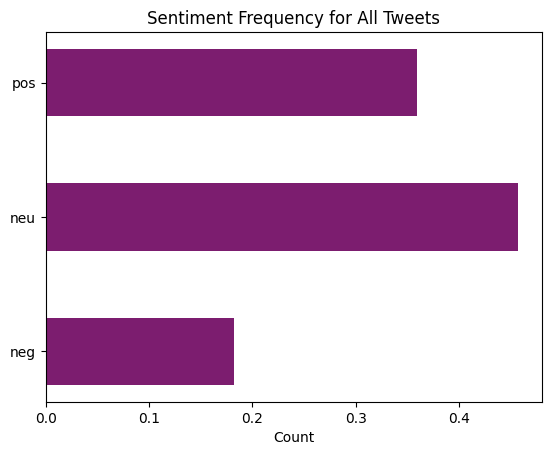

In [ ]:
plot_sentiment(scorelist, title = "Sentiment Frequency for All Tweets")

The majority of tweets were observed to contain neutral sentiment. Overall there were twice as many positive tweets than negative, but this proportion may not be entirely accurate. It may be the case that most tweets are more objective than subjective on the topic of coronavirus.

In [ ]:
# map of mean sentiment polarity by state
#import plotly.offline as pyo
import plotly.express as px
#pyo.init_notebook_mode()

# subset tweets to those geocoded to be in the US
df_us = df.copy()
df_us['polarity'] = scorelist
df_us = df_us.loc[(df_us.country == 'United States') & (df_us.state.notnull()), ['state', 'polarity']]

df_us = df_us.groupby('state').mean()
fig = px.choropleth(
    df_us, 
    locations = df_us.index,
    locationmode="USA-states",
    scope="usa",
    color = 'polarity',
    hover_name = df_us.index, 
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Mean Sentiment Polarity Across the States',
    width = 800
)
fig.show()

States that exhibited the most positive sentiment were Nebraska and Missouri. In contrast, those that averaged the lowest in sentiment were Montana, West Virginia, Vermont and Delaware. The majority of the states ranged from neutral to positive.

### Tweet Semantic Frequency
This process uses the LIWC (Linguistic Inquiry and Word Count) resource to construct semantic features for tweet observations. The purpose of these labels is to provide context relative to the discussion topics. These categories were hand-selected to address aspects of well-being (i.e. *life satisfaction*).

Specific labels of interest include those that may discretely measure **well-being**:
* Religion
* Leisure
* Health
* Biological processes
* Positive emotion
* Negative Emotion
* Anxiety
* Anger
* Sadness
* Work
* Affective processes

This logic concerning well-being extends from the following publication: 
* [Characterizing Geographic Variation in Well-Being using Tweets](https://static1.squarespace.com/static/53d29678e4b04e06965e9423/t/54bd445ee4b054556ebea24a/1421689950741/2013_ICWSM_wellbeing.pdf).
* In this study, topics were determined to be predictive of subjective well-being.
* This study also used the LIWC lexicon to qualify the language used in Tweets.

The LIWC lexicon is obtained for research and educational purposes and should not be used in products or for commercial gain without proper licensing.

In [ ]:
# read the words of each class from LIWC lexicon
religion, leisure, health, bioprocess, posemo, negemo, anxiety, anger, sad, work, affect = ([] for i in range(11))
with open('drive/Shared drives/IST718-Summer2020-Team/Twitter/lexicon/liwcdic2007.dic', encoding='latin1') as fin:
  # read all LIWC words from file
  wordlines = [line.strip() for line in fin]
  # each line has a word or a stem followed by * and numbers of the word classes it is in
  # word class 359 is religion; word class 356 is leisure; word class 148 is health; 
  # word class 146 is biological process; word class 126 is positive emotion; word class 127 is negative emotion;
  # word class 128 is anxiety; word class 129 is anger; word class 130 is sadness, word class 354 is work;
  # word class 125 is affective process
  for line in wordlines:
    if not line == '':
      items = line.split()
      word = items[0]
      classes = items[1:]
      for c in classes:
        if c == '359':
          religion.append(word)
        if c == '356':
          leisure.append(word)
        if c == '148':
          health.append(word)
        if c == '146':
          bioprocess.append(word)
        if c == '126':
          posemo.append(word)
        if c == '127':
          negemo.append(word)
        if c == '128':
          anxiety.append(word)
        if c == '128':
          anger.append(word)
        if c == '130':
          sad.append(word)
        if c == '354':
          work.append(word)
        if c == '125':
          affect.append(word)

def isPresent(word, classlist):
  """Utility function to check if a word is in a particular class list of words        

  Arguments:
      word {[str]} -- [a search word]
      classlist {[list]} -- [a list of words respective to a class]
  
  Returns:
      [bool] -- [True if word belongs to class; False if not belong to class]
  """ 
  isFound = False
  # loop over all elements of list
  for classword in classlist:
    # test if a word or a stem
    if not classword[-1] == '*':
      # it's a word!
      # when a match is found, can quit the loop with True
      if word == classword:
        isFound = True
        break
    else:
      # it's a stem!
      # when a match is found, can quit the loop with True
      if word.startswith(classword[0:-1]):
        isFound = True
        break
  # end of loop
  return isFound

def getClasses(text):
  """Utility function to construct a dictionary of semantic label features        

    Arguments:
        text {[str]} -- [a tweet observation]        
    
    Returns:
        [dict] -- [dictionary of k:v where k is class and v is bool]
  """
  out = {}      
  wordlist = list(set(text.split()))
  out['religion'] = any([isPresent(w, religion) for w in wordlist])
  out['leisure'] = any([isPresent(w, leisure) for w in wordlist])
  out['health'] = any([isPresent(w, health) for w in wordlist])
  out['bioprocess'] = any([isPresent(w, bioprocess) for w in wordlist])
  out['posemo'] = any([isPresent(w, posemo) for w in wordlist])
  out['negemo'] = any([isPresent(w, negemo) for w in wordlist])
  out['anxiety'] = any([isPresent(w, anxiety) for w in wordlist])
  out['anger'] = any([isPresent(w, anger) for w in wordlist])
  out['sad'] = any([isPresent(w, sad) for w in wordlist])
  out['work'] = any([isPresent(w, work) for w in wordlist])
  out['affect'] = any([isPresent(w, affect) for w in wordlist])
  return out


In [ ]:
%%time
# obtaining semantic features and saving to file if necessary
import os
save_to_folder = 'drive/Shared drives/IST718-Summer2020-Team/Twitter'
fname = 'semantic_features.csv'
full_name = save_to_folder + '/' + fname

if fname not in os.listdir(save_to_folder):
  # construct a data frame of semantic features by observation
  semantic_features = pd.DataFrame([getClasses(x) for x in df['text_clean'].tolist()])
  semantic_features.to_csv(full_name, index=None)
else:
  semantic_features = pd.read_csv(full_name)

CPU times: user 193 ms, sys: 9.01 ms, total: 202 ms
Wall time: 423 ms


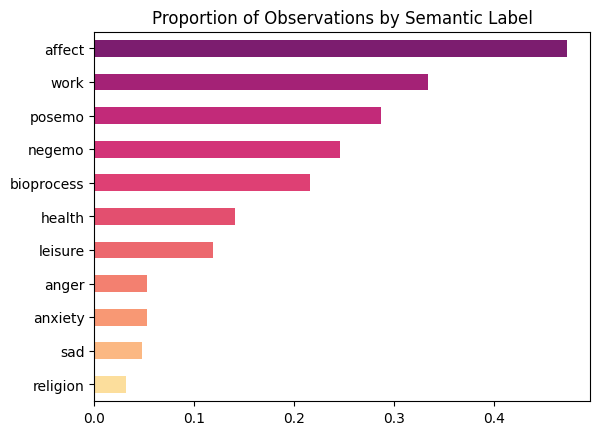

In [ ]:
# plot frequencies of observations by semantic feature
colors = SDcmap(np.linspace(0,1, 11))
semantic_features.apply(pd.Series.value_counts, normalize=True).T.sort_values(by=True)[True].plot(kind = 'barh',color = colors)
plt.title('Proportion of Observations by Semantic Label')
plt.show()

**Affective processes** include all feelings and responses, positive or negative, related to emotion-laden behavior, knowledge, or beliefs. This feature is represented in about 50% of the data. At the other end of the spectrum, **religion** is the least conveyed feature in this sample of tweets.

These semantic labels may be useful for filtering the data in order to explore topics in context. Some of these semantic labels are clearly more useful than others given their prevalence in the data. However, the sample set may be large enough such that one or more meaningful topics are discovered in the context of these aspects of well-being.

In [ ]:
# combine semantic labels with dataframe
df = pd.concat([df, semantic_features], axis=1).set_index('id')

In [ ]:
# dictionary of semantic label to title
label_dict = {
    'religion': 'Religion', 'leisure': 'Leisure', 'health': 'Health',
    'bioprocess': 'Biological Processes', 'posemo': 'Positive Emotion',
    'negemo': 'Negative Emotion', 'anxiety': 'Anxiety', 'anger': 'Anger',
    'sad': 'Sadness', 'work': 'Work', 'affect': 'Affective Processes'
}

CPU times: user 2min 28s, sys: 769 ms, total: 2min 29s
Wall time: 2min 29s


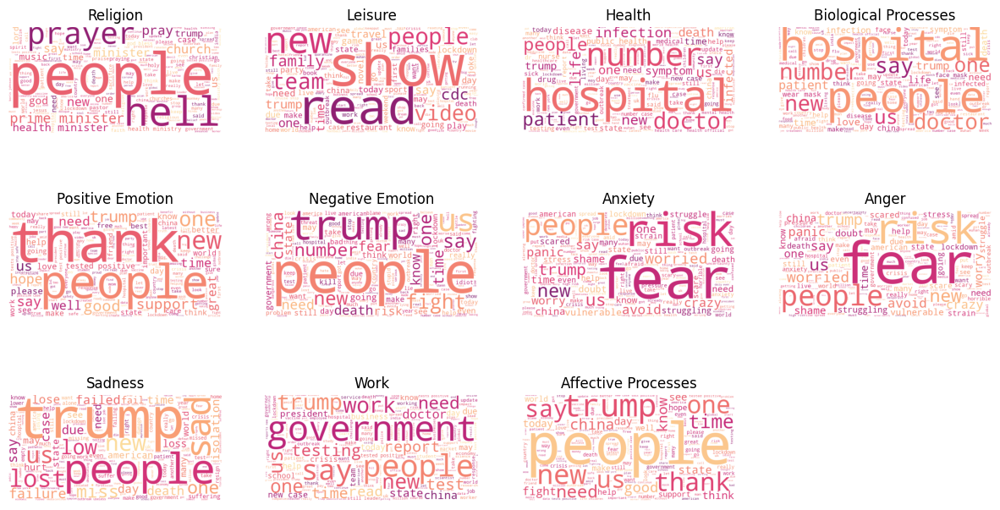

In [ ]:
%%time
# word clouds by semantic context
fig = plt.figure()
fig.set_size_inches(15,8)
label_list = semantic_features.columns.tolist()
for i in range(len(label_list)):
    my_label = label_list[i]
    ax = fig.add_subplot(3,4,i+1)
    wordcloud = get_wc_obj(df.loc[df[my_label], 'text_clean'],600,300)
    plt.title(label_dict[my_label])
    ax.imshow(wordcloud)
    ax.axis('off')

The word clouds above show some redundancy in terms across semantic features. It is clear that entities such as 'Trump' and 'People' have a great deal of influence on affective processes that impact us socially. It is also clear that government plays a large role when it comes to work and jobs. People and Trump span across all of these semantic contexts as a major player, and it may imply that these two are the greatest levers in helping to alleviate impact to well-being.

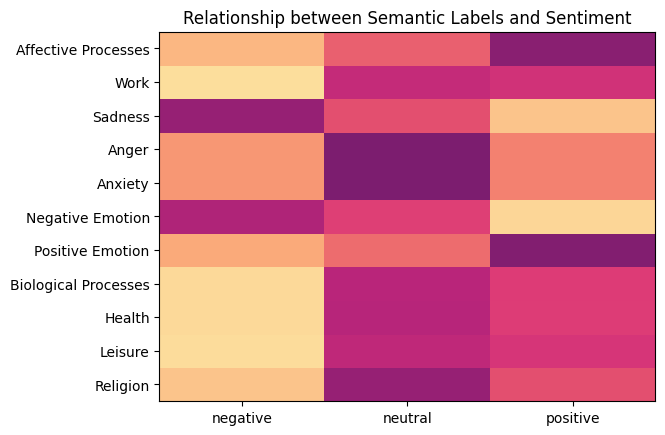

In [ ]:
from sklearn.preprocessing import StandardScaler
# what is the relationship between semantic labels and sentiment?
def getSentLabel(score):
  if score > 0:
    return 'positive'
  elif score == 0:
    return 'neutral'
  else:
    return 'negative'

df['sentiment'] = list(map(getSentLabel, scorelist))
keep_cols = ['religion','leisure','health','bioprocess','posemo','negemo','anxiety','anger','sad','work','affect','sentiment']
ct = df[keep_cols].groupby('sentiment').sum().T
ct.index = [label_dict[x] for x in ct.index]
scaler = StandardScaler()
scaled_rows = scaler.fit_transform(ct.T).T
scaled_ct = pd.DataFrame(data = scaled_rows, columns = ct.columns, index=ct.index)
plt.pcolor(scaled_ct, cmap = SDcmap)
plt.yticks(np.arange(0.5, len(ct.index), 1), ct.index)
plt.xticks(np.arange(0.5, len(ct.columns), 1), ct.columns)
plt.title("Relationship between Semantic Labels and Sentiment")
plt.show()

# Analysis
This analysis seeks to identify 10 major topics of discussion across the 11 semantic contexts that may be representative of well-being, so that it may be inferred how the pandemic has affected people and what the future may look like socially. 

The main method used is LDA (latent dirischlet allocation). Within each context, tweets are subset, and topics are identified. This is done so that it may be understood how people are impacted within these aspects of well-being.

Defined semantic contexts:
* Religion
* Leisure
* Health
* Biological processes
* Positive emotion
* Negative Emotion
* Anxiety
* Anger
* Sadness
* Work
* Affective processes

This logic concerning well-being extends from the following publication: 
* [Characterizing Geographic Variation in Well-Being using Tweets](https://static1.squarespace.com/static/53d29678e4b04e06965e9423/t/54bd445ee4b054556ebea24a/1421689950741/2013_ICWSM_wellbeing.pdf).
* In this study, topics were determined to be predictive of subjective well-being.
* This study also used the LIWC lexicon to qualify the language used in Tweets.

Topic modeling analysis will be applied to the subset of tweets that are applicable to each semantic context.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from nltk.corpus import stopwords
import gc
stop_words = list(set(stopwords.words('english')))
stop_words.extend(['rt','amp','coronavirus','virus','pandemic','covid','fucking','shit','fuck','via'])

In [ ]:
def modelLDA(tweets, n_topics=10):
  """Utility function to construct a dictionary containing a fitted lda model and feature names

    Arguments:
        tweets {[list]} -- [a list of tweets]
        n_topics {[int]} -- [number of topics we want]
    
    Returns:
        [dict] -- [dictionary that contains a fitted lda model and term features]
  """
  # instantiate vectorizer
  my_token_pattern = re.compile(r'[A-Za-z]+') # alphabetic words only
  vec = TfidfVectorizer(
      max_df = 0.95, min_df = 2, stop_words=stop_words,
      use_idf = True, norm = 'l2', token_pattern=my_token_pattern
  )
  # create document term matrix
  dtm = vec.fit_transform(tweets)
  feat_names = vec.get_feature_names()
  doc_names = df.index
  # instantiate and fit LDA model
  lda = LatentDirichletAllocation(
      n_components=n_topics, max_iter=5, 
      learning_method='online', learning_offset=50,
      random_state=0
  )
  lda_z = lda.fit_transform(dtm.toarray()) # transformed array
  out = {}
  out['model'] = lda
  out['feature_names'] = feat_names
  out['array'] = lda_z
  return out

def topicWordCloud(model, feature_names, topic_number):
  """Utility function to generate a word cloud highlighting terms relevant to a topic

    Arguments:
        model {[model]} -- [a LDA model from modelLDA()['model']]        
        feature_names {[list]} -- [a list of term features from modelLDA()['feature_names']]        
        topic_number {[int]} -- [index of a model component]
    Returns:
        [wordcloud] -- [a wordcloud object]
  """
  topic = model.components_[topic_number]  
  freqDict = {}
  for i in range(len(topic)):
    freqDict[feature_names[i]]= int(topic[i] / topic.sum()*10000)
  wordcloud = WordCloud(max_font_size=160,relative_scaling=1,background_color='white',colormap=SDcmap,random_state=42, width = 600, height = 300).generate_from_frequencies(freqDict)
  return wordcloud

def plotTopicTerms(lda):
  """Utility function to plot an array of word clouds respective to topics in an LDA model

    Arguments:
        lda {[dict]} -- [a dictionary containing the lda model, feature names, and transformed array]                
  """
  n_topics = 10
  fig = plt.figure()
  fig.set_size_inches(15,8)  
  for i in range(n_topics):
    ax = fig.add_subplot(2, 5, i + 1)
    wordcloud = topicWordCloud(lda['model'], lda['feature_names'], i)
    ax.imshow(wordcloud)
    plt.title("Topic {:d}".format(i))
    ax.axis('off')
    plt.tight_layout()

def plotTopicFrequency(lda_array):
  """Utility function to plot the frequency of observations by their most likely topic

    Arguments:
        lda_array {[numpy.ndarray]} -- [a transformed array from modelLDA()['array']]        
  """
  docs_vs_topics = pd.DataFrame(lda_array)
  most_likely_topics = docs_vs_topics.idxmax(axis=1)
  most_likely_topics.groupby(most_likely_topics).count().plot(kind='bar', color = single_dim_color)
  plt.title("Number of Observations by Their Most Likely Topic")
  plt.xticks(rotation = 0)
  plt.xlabel("Topic")
  plt.ylabel("Frequency")
  plt.show()

### Semantic Context: Religion

CPU times: user 16.8 s, sys: 619 ms, total: 17.4 s
Wall time: 17.1 s


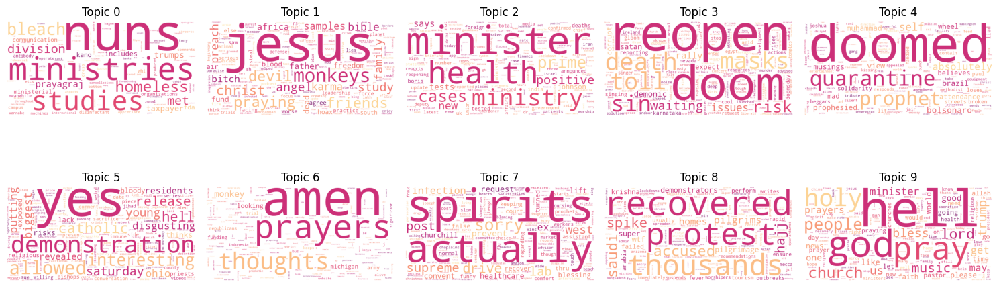

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['religion']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Althought the context of religion doesn't appear too often in the data relative to others, there appears to be one coherent topic that discusses ministries that reach out to the homeless population during the time of pandemic. Perhaps there have been some studies done as well concerning the effects on vulnerable populations. Interestingly, one might think that churches would be closed due to gathering restrictions and decreased attendance during the pandemic, but there appears to be little mention of that from the tweets. 

### Semantic Context: Leisure

CPU times: user 1min 11s, sys: 2.01 s, total: 1min 13s
Wall time: 1min 13s


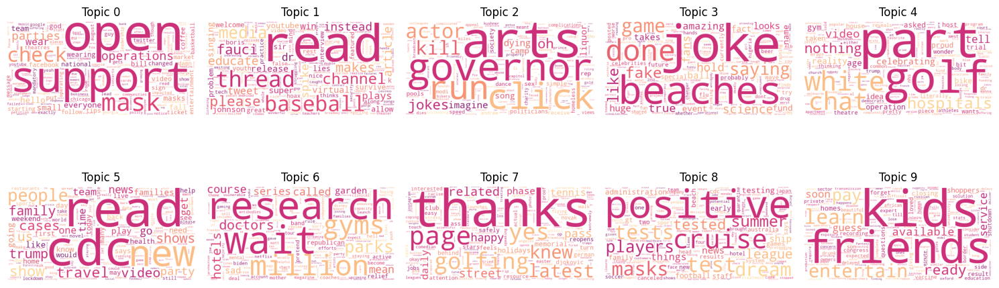

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['leisure']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Over the summer of 2020, Coronavirus has had a large impact on outdoor gatherings, particularly in beaches. Cruises have witnessed many positive cases of infection and sports leagues have had to suspend or cancel seasons. Parties, kids, and friendships were impacted. Golf and tennis appear to stand out as safer alternatives for spending leisure time.

### Semantic Context: Health

CPU times: user 1min 27s, sys: 948 ms, total: 1min 28s
Wall time: 1min 28s


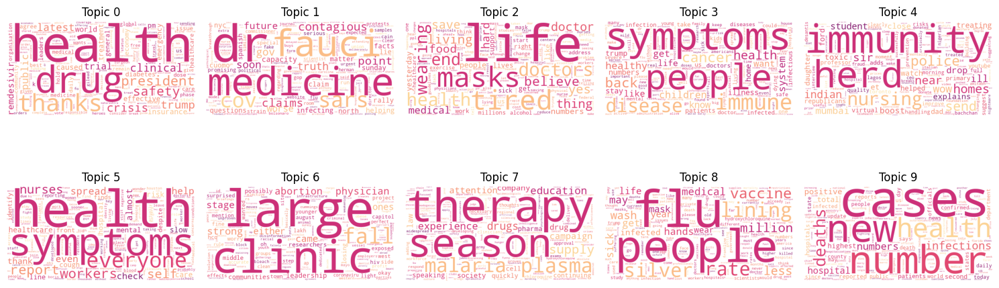

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['health']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

In regards to health, major topics on people's minds are drugs, treatment options, and symptoms. People obviously need to wear masks, herd immunity, and health statistics have been major topics. Therapies including convalescent plasma and malaria drugs are also hot topics thus far.

### Semantic Context: Biological Processes

CPU times: user 2min 34s, sys: 19.5 s, total: 2min 54s
Wall time: 2min 54s


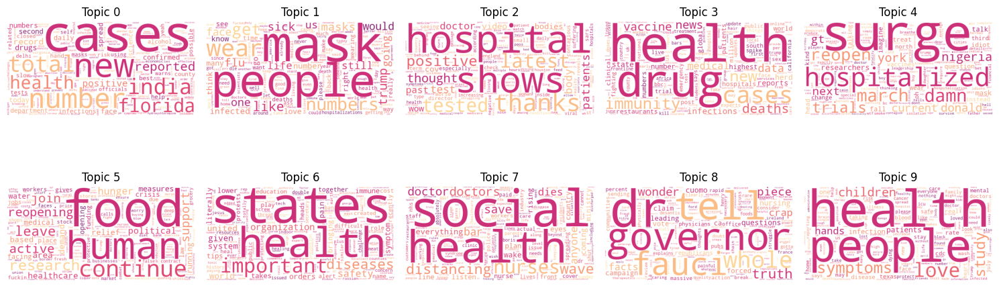

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['bioprocess']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Food and basic necessities continue to be a major topic concerning physical well-being. There's a lot taken on faith and trust of government officials like Dr. Fauci to tell the truth, or perhaps there are trust issues with the same. Over this short period of time there have been surges in infection rates which contrast with reopening businesses and markets. Social distancing and health go hand-in-hand and will be key to confronting the next wave.

### Semantic Context: Positive Emotion

CPU times: user 3min 41s, sys: 24.5 s, total: 4min 5s
Wall time: 4min 5s


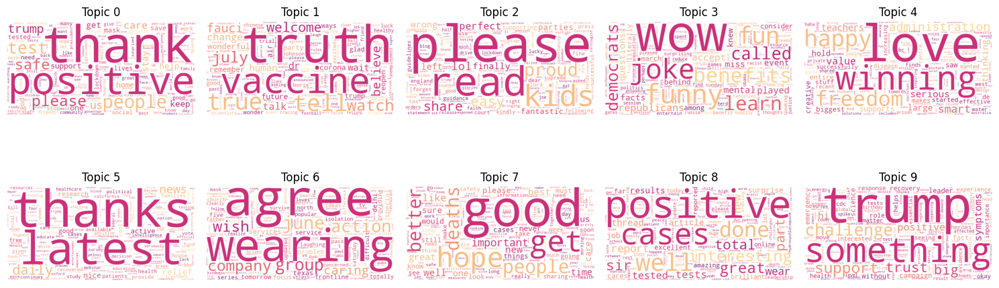

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['posemo']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

People are optimistic about a vaccine. There is a lot of thanks and appreciation going around for various entities like government and teachers. There is positive agreement on wearing masks when with company. People are entrusting their well-being in large part to Trump. There also appears to be some positive outlook based on the benefits people are receiving or set to receive during to the pandemic.

### Semantic Context: Negative Emotion

CPU times: user 2min 58s, sys: 800 ms, total: 2min 58s
Wall time: 2min 58s


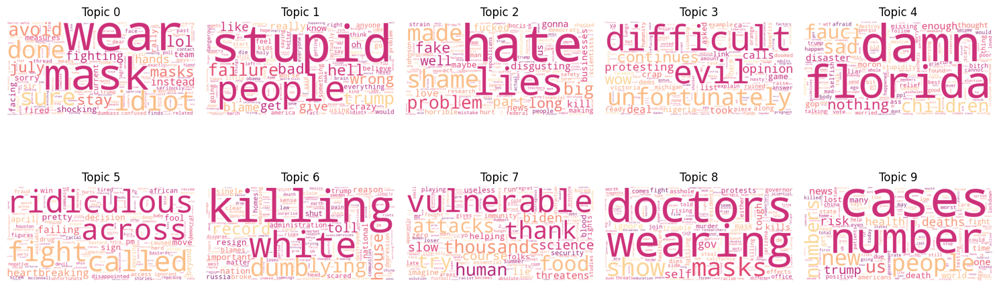

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['negemo']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Wearing masks ranks high in terms of its association to negative emotion. Certain groups of people and their actions are construed as being stupid. Florida's policies may have encited a lot of negative emotion. There is a topic about killing, which may or may not directly relate to coronavirus but rather to concurrent events such as police killings. The number of death cases continue to cause a lot of negative emotions.

### Semantic Context: Anxiety

CPU times: user 27.9 s, sys: 935 ms, total: 28.8 s
Wall time: 28.6 s


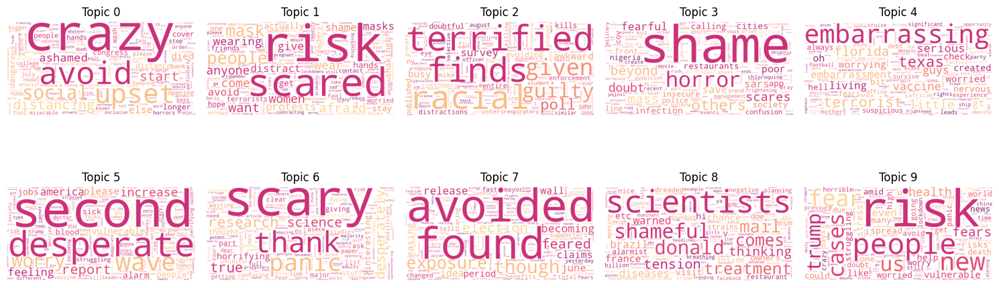

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['anxiety']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

People are anxious about a second wave, perhaps in regards to the coming fall / winter season. The November elections are another topic of anxiety. This could also tie in with another topic having to do with the mail service. Trump is associated with multiple topics that cause anxiety.

### Semantic Context: Anger

CPU times: user 28.3 s, sys: 451 ms, total: 28.8 s
Wall time: 28.5 s


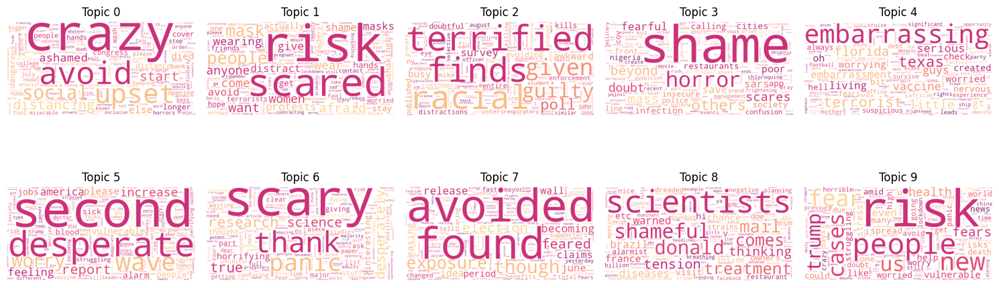

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['anger']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Some topics that anger people may include social distancing, impact to acadmics, mask wearing, and racial inequity issues. A lot of people seem to be angry concerning Texas and Florida. Similar to the context of anxiety, many of these topics appear as reoccurring themes, including a potential second wave and concerns about the mail.

### Semantic Context: Sadness

CPU times: user 26.3 s, sys: 456 ms, total: 26.7 s
Wall time: 26.5 s


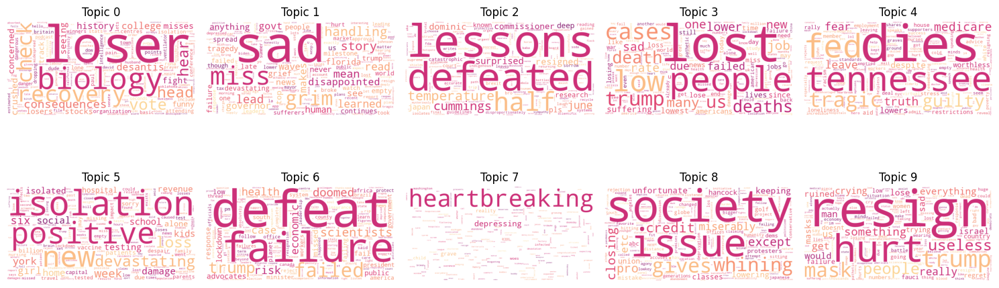

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['sad']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

People are sad because of the high impact that the virus has already had on the population. They may feel defeated and see certain major efforts of handling the virus as failures. Many people are isolated and alone. People are sad because of the impact and lost opportunity concerning academics and schooling for kids, as well as other major closures.

### Semantic Context: Work

CPU times: user 4min 38s, sys: 19.9 s, total: 4min 58s
Wall time: 4min 58s


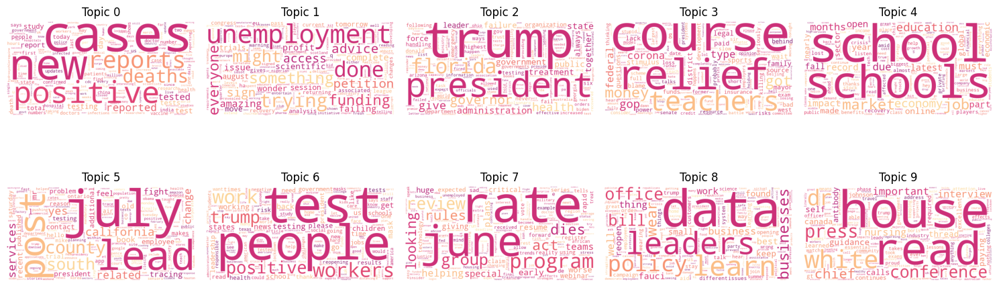

In [ ]:
%%time
# subset tweets given a semantic context
df_sub = df[df['work']]
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Regarding work, unemployment is a big issue and businesses are concerned with profit or funding during this time. Teachers and schools are major topics where there's much discussion concerning the upcoming back-to-school in the fall. Florida appears to be the rogue once again in the context of work as well. Trump's actions appear in a critical light, possibly as a failure towards handling the situation concerning states. The month of July seemed to hold significance towards impacts within California and its counties. The months of July and June appear to be topics of their own, and perhaps they may be indicative of some inflection point in workforce management during the pandemic. People are looking for strong leadership. Work-related testing is of paramount importance to support the workforce. Businesses are heavily reading into data and policy in assessing the risks of reopening.

### Semantic Context: Affective Processes
* Includes all feelings and responses, positive or negative, related to emotion-laden behavior, knowledge, or beliefs.

CPU times: user 5min 15s, sys: 9.96 s, total: 5min 25s
Wall time: 5min 25s


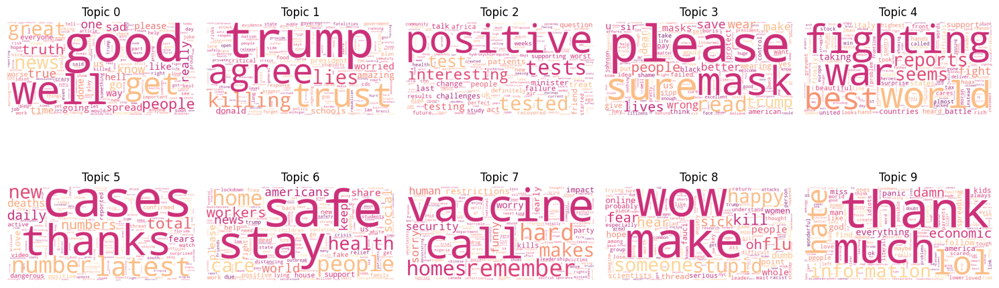

In [ ]:
%%time
# subset tweets given a semantic context; down-sample due to RAM limitations
df_sub = df[df['affect']].sample(100000, random_state=0)
# construct lda information
lda = modelLDA(df_sub['text_clean'], n_topics=10)
# plot of top terms by topic
plotTopicTerms(lda)

Trump appears to be killing the people's trust in the government due to lies and misinformation. There seems to be concern and debate regarding schools and food, and people want to be able to trust government and leaders to lay out the best course of action. People are impressing upon themselves to wear masks to save lives. There appears to be a call for the world to unite in fighting this pandemic together, comparing the situation we're in to a war. There's a shared concern for the health and safety of workers, perhaps much for those in health care.

# Recommendation
* How has this pandemic impacted people? Can this be determined through the data and methods described?
* Is the data indicative of social impacts people can expect in the future?

Major topics discovered through modeling are effective in describing current impacts to people. These include the following:
* Vulnerable populations
* Non-profits and religious groups
* Social distancing
* Opportunities for children
* Mask wearing
* Building trust with leaders
* Healthcare and research
* Supporting businesses
* Vaccines
* Government benefits and stimulous
* The federal government and states
* Second wave
* Unemployment
* Testing

If the topics discussed today can impact the future, then these recommendations are the major areas where policies and resources should be allocated to:

* Prioritize the safety of the homeless, minorities, and vulnerable populations.
* Support non-profits and religious organizations in their ministries to help the affected.
* Invest in children and make sure they have the opportunity to learn and grow with together with friends.
* Be strategic around more control over large gatherings and social distancing, and healthcare and research.
* Vaccine strategy should be given the highest priority.
* The federal government should take a stronger role in ensuring that rogue states don't deviate from a sound national strategy.
* Have better communication regarding the positive benefits of mask wearing, and do not simply enforce rules concerning it.
* Enable leaders to build trust with the public.
* Provide clarity and assurance around reopening to the business community and invest in innovations to better adapt to the environment.
* Testing should be made more available and within the influence of the business community to assure the safety of workers.
* Government strategies for spending on stimulus and benefits are effective and should be continued.
* The highest priority should go towards strategically mitigating the impacts of a potential second wave.